Paper: "The Role of Patients’ Age on Their Preferences for Choosing Additional Blood Pressure-Lowering Drugs: A Discrete Choice Experiment in Patients with Diabetes"

Author(s): Sieta T. de Vries, Folgerdiena M. de Vries, Thijs Dekker, Flora M. Haaijer-Ruskamp, Dick de Zeeuw, Adelita V. Ranchor, and Petra Denig

Year: 2015

Model(s): Multinomial Logit

Main findings: \_\_\_\_

# Import needed libraries

In [1]:
import sys
from collections import OrderedDict

import scipy.stats

import numpy as np
import pandas as pd

import seaborn as sbn
import matplotlib.pyplot as plt

from statsmodels.formula.api import logit

sys.path.insert(0, '/Users/timothyb0912/Documents/pylogit/')
import pylogit as pl

sys.path.insert(0, '../../src/')
from visualization import predictive_viz as viz

%matplotlib inline

/Users/timothyb0912/anaconda/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


# Import data

In [2]:
data_path =\
    '../../data/raw/deVries_2015/deVries_2015_data.dta'
df = pd.read_stata(data_path)

# Look at data

In [3]:
df.shape

(4830, 32)

In [4]:
df.head().T

,0,1,2,3,4
gender,Male,Male,Female,Male,Male
age,68,52,73,71,62
version,3,2,1,3,3
choice,Not chosen,Not chosen,Not chosen,Chosen,Not chosen
choice_situation,27,22,21,8,30
choice_possibility,Additional drug B,No additional drug,No additional drug,Additional drug B,Additional drug B
bloodpressure,150,160,160,140,150
death,0.11,0.13,0.13,0.11,0.09
heartattack,0.05,0.07,0.07,0.05,0.05
stroke,0.06,0.07,0.07,0.05,0.05


In [5]:
set(df.columns.tolist())

{'ADRs',
 'ADRs_age75',
 'age',
 'age_75',
 'bloodpressure',
 'bloodpressure_age75',
 'choice',
 'choice_possibility',
 'choice_situation',
 'death',
 'death_age75',
 'dintake1',
 'dintake1_age75',
 'dintake2',
 'dintake2_age75',
 'dintake3',
 'dintake4',
 'dominant_correct',
 'gender',
 'heartattack',
 'heartattack_age75',
 'intake',
 'newpat_nr',
 'noconstant23',
 'noconstant23_age75',
 'number_nodrug',
 'seq',
 'stroke',
 'stroke_age75',
 'total_nodrug',
 'total_nodrug_2groups',
 'version'}

# Clean data

In [6]:
# Create an integer choice column
df['choice'] = df.choice.map({'Not chosen': 0, 'Chosen': 1})

# Create an integer alternative id column
alt_id_map = {'No additional drug': 1,
              'Additional drug A': 2,
              'Additional drug B': 3}
alt_id_reverse_map = {alt_id_map[k]: k for k in alt_id_map}
df['alt_id'] = df.choice_possibility.map(alt_id_map)

# Make age_75, i.e. age >= 75 an integer column
df['age_75'] =\
    df['age_75'].map({'<75 years': 0, '>= 75 years': 1})

# Create an additional_drug column
df['additional_drug'] =\
    df.noconstant23.map({'No additional drug': 0,
                         'Additional drug': 1})

# Create a column for one_in_morning_one_in_evening
df['one_in_morning_one_in_evening'] =\
    df.dintake1.map({'not 1 morning, 1 evening': 0,
                     '1 morning, 1 evening': 1})
    
# Create a column for combination_tablet
df['combination_tablet'] =\
    df.dintake2.map({'not combi in the morning': 0,
                     'Combi in the morning': 1})

# Filter out the individuals choosing the non-dominant alternative
non_dominant_filter = df.dominant_correct == 'Correct'

In [7]:
clean_df =\
    df.loc[non_dominant_filter].copy().sort_values('seq')

# Look at the shape of clean_df
print('clean_df.shape == {}'.format(clean_df.shape))

# Look at some records in clean_df
clean_df.head(6).T


clean_df.shape == (4530, 36)


,79,107,968,1436,2079,2561
gender,Male,Male,Male,Male,Male,Male
age,60,60,60,60,60,60
version,3,3,3,3,3,3
choice,0,1,0,0,0,1
choice_situation,3,3,3,4,4,4
choice_possibility,Additional drug B,Additional drug A,No additional drug,Additional drug A,No additional drug,Additional drug B
bloodpressure,150,140,160,150,160,140
death,0.09,0.11,0.13,0.09,0.13,0.11
heartattack,0.06,0.05,0.07,0.05,0.07,0.06
stroke,0.06,0.05,0.07,0.06,0.07,0.05


# Compute needed transformations / derived features

In [8]:
# Create needed interactions with age_75
clean_df['additional_drug_age75'] =\
    clean_df.additional_drug * clean_df.age_75.values

clean_df['one_in_morning_one_in_evening_age75'] =\
    (clean_df.one_in_morning_one_in_evening *
     clean_df.age_75.values)

clean_df['combination_tablet_age75'] =\
    clean_df.combination_tablet * clean_df.age_75.values

# Define the model specification and parameter names

In [9]:
base_explanatory_vars =\
    ['additional_drug',
     'bloodpressure',
     'death',
     'heartattack',
     'stroke',
     'ADRs',
     'one_in_morning_one_in_evening',
     'combination_tablet',
    ]

base_display_names = ['Constant (additional drug)',
                      'Blood pressure',
                      'Death within the next 5 years',
                      'Limitations heart attack',
                      'Limitations stroke',
                      'Adverse drug events',
                      'Additional tablet in the morning',
                      'Combination tablet']

interaction_explanatory_vars =\
    (base_explanatory_vars + 
     [col + '_age75' for col in base_explanatory_vars])
    
interaction_display_names =\
    (base_display_names + 
     [col + ' (age >= 75)' for col in base_display_names])

missing_vars =\
    [x for x in interaction_explanatory_vars
     if x not in clean_df.columns]
if len(missing_vars) > 0:
    msg = 'These explanatory variables are not in the data file:'
    raise ValueError(msg + '\n{}'.format(missing_vars))


# Populate the specification and name dictionaries
class SpecInfo(object):
    def __init__(self,
                 variable_list,
                 display_names):
        self.variable_list = variable_list
        self.name_list = display_names
        self.spec_dict = OrderedDict()
        self.name_dict = OrderedDict()
        
        self.populate_spec_and_name_dicts()
        return None
        
    def populate_spec_and_name_dicts(self):
        num_vars = len(self.variable_list)
        for pos in range(num_vars):
            current_column = self.variable_list[pos]
            self.spec_dict[current_column] = 'all_same'
            self.name_dict[current_column] = self.name_list[pos]
        return None

base_model_info = SpecInfo(base_explanatory_vars,
                           base_display_names)

interaction_info = SpecInfo(interaction_explanatory_vars,
                            interaction_display_names)

# Set model parameters

In [10]:
choice_col = 'choice'
alt_id_col = 'alt_id'
obs_id_col = 'seq'

# Create the model object(s)

In [11]:
model_obj =\
    pl.create_choice_model(
        data=clean_df,
        alt_id_col=alt_id_col,
        obs_id_col=obs_id_col,
        choice_col=choice_col,
        specification=base_model_info.spec_dict,
        model_type='MNL',
        names=base_model_info.name_dict)

interaction_obj =\
    pl.create_choice_model(
        data=clean_df,
        alt_id_col=alt_id_col,
        obs_id_col=obs_id_col,
        choice_col=choice_col,
        specification=interaction_info.spec_dict,
        model_type='MNL',
        names=interaction_info.name_dict)

# Estimate and view the model

In [12]:
model_obj.fit_mle(np.zeros(len(base_display_names)))
model_obj.get_statsmodels_summary()

Log-likelihood at zero: -1,658.9046
Initial Log-likelihood: -1,658.9046
Estimation Time for Point Estimation: 0.09 seconds.
Final log-likelihood: -1,493.6060


/Users/timothyb0912/anaconda/lib/python2.7/site-packages/scipy/optimize/_minimize.py:507: RuntimeWarning: Method BFGS does not use Hessian information (hess).
  RuntimeWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Multinomial Logit Model Regression Results                    
===================================================================================
Dep. Variable:                      choice   No. Observations:                1,510
Model:             Multinomial Logit Model   Df Residuals:                    1,502
Method:                                MLE   Df Model:                            8
Date:                     Fri, 01 Feb 2019   Pseudo R-squ.:                   0.100
Time:                             08:50:04   Pseudo R-bar-squ.:               0.095
AIC:                             3,003.212   Log-Likelihood:             -1,493.606
BIC:                             3,045.771   LL-Null:                    -1,658.905
====================================================================================================
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Constant (additional drug)          -1.2640      0.235     -5.374      0.000      -1.725      -0.803
Blood pressure                      -0.0837      0.007    -12.003      0.000      -0.097      -0.070
Death within the next 5 years      -22.1292      3.379     -6.550      0.000     -28.751     -15.507
Limitations heart attack            -9.1561      6.700     -1.367      0.172     -22.288       3.976
Limitations stroke                 -26.6543      6.755     -3.946      0.000     -39.895     -13.414
Adverse drug events                -14.1398      1.401    -10.093      0.000     -16.886     -11.394
Additional tablet in the morning     0.0713      0.089      0.799      0.424      -0.104       0.246
Combination tablet                   0.1291      0.090      1.435      0.151      -0.047       0.306
====================================================================================================
"""

In [13]:
interaction_obj.fit_mle(np.zeros(len(interaction_display_names)))
interaction_obj.get_statsmodels_summary()

Log-likelihood at zero: -1,658.9046
Initial Log-likelihood: -1,658.9046
Estimation Time for Point Estimation: 0.08 seconds.
Final log-likelihood: -1,460.9309


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Multinomial Logit Model Regression Results                    
===================================================================================
Dep. Variable:                      choice   No. Observations:                1,510
Model:             Multinomial Logit Model   Df Residuals:                    1,494
Method:                                MLE   Df Model:                           16
Date:                     Fri, 01 Feb 2019   Pseudo R-squ.:                   0.119
Time:                             08:50:05   Pseudo R-bar-squ.:               0.110
AIC:                             2,953.862   Log-Likelihood:             -1,460.931
BIC:                             3,038.980   LL-Null:                    -1,658.905
================================================================================================================
                                                   coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------
Constant (additional drug)                      -1.0510      0.281     -3.740      0.000      -1.602      -0.500
Blood pressure                                  -0.0927      0.008    -11.171      0.000      -0.109      -0.076
Death within the next 5 years                  -21.7868      3.980     -5.474      0.000     -29.587     -13.987
Limitations heart attack                        -9.1251      7.900     -1.155      0.248     -24.609       6.358
Limitations stroke                             -30.2182      7.964     -3.794      0.000     -45.828     -14.608
Adverse drug events                            -15.5854      1.673     -9.315      0.000     -18.865     -12.306
Additional tablet in the morning                 0.1306      0.106      1.237      0.216      -0.076       0.337
Combination tablet                               0.0982      0.107      0.914      0.361      -0.112       0.309
Constant (additional drug) (age >= 75)          -0.5970      0.527     -1.133      0.257      -1.629       0.435
Blood pressure (age >= 75)                       0.0318      0.016      2.025      0.043       0.001       0.062
Death within the next 5 years (age >= 75)       -2.6391      7.687     -0.343      0.731     -17.706      12.428
Limitations heart attack (age >= 75)            -2.1844     15.232     -0.143      0.886     -32.039      27.670
Limitations stroke (age >= 75)                  14.5092     15.345      0.946      0.344     -15.567      44.585
Adverse drug events (age >= 75)                  4.7849      3.145      1.522      0.128      -1.379      10.948
Additional tablet in the morning (age >= 75)    -0.2274      0.204     -1.117      0.264      -0.626       0.172
Combination tablet (age >= 75)                   0.1148      0.200      0.575      0.566      -0.277       0.507
================================================================================================================
"""

# Set checking parameters

In [14]:
NUM_SAMPLES = 200
RANDOM_SEED = 100

np.random.seed(RANDOM_SEED)

# Sample from the posterior or approximate sampling distribution of model parameters

In [15]:
class CheckingObject(object):
    def __init__(self, pylogit_obj, num_samples, seed=None):
        # Set object attributes
        self.model = pylogit_obj
        self.hessian = pylogit_obj.hessian
        self.asym_cov = pylogit_obj.cov
        self.asym_dist =\
            scipy.stats.multivariate_normal(
                mean=pylogit_obj.params, cov=self.asym_cov)
        self.posterior_probs = None
        self.sim_y = None
        
        # Set the random seed, if desired
        if seed is not None:
            np.random.seed(seed)

        # Get and set the posterior parameter samples
        self.param_samples = self.asym_dist.rvs(num_samples)
        # Compute and set the posterior probabilities
        self.compute_posterior_probs()
        # Compute and set the simulated choices
        self.simulate_choices()
        return None
        
    def compute_posterior_probs(self):
        self.posterior_probs =\
            self.model.predict(self.model.data,
                               param_list=[self.param_samples.T,
                                           None, None, None])
        return None

    def simulate_choices(self):
        self.sim_y =\
            viz.simulate_choice_vector(
                self.posterior_probs,
                self.model.data[self.model.obs_id_col].values)
        return None

In [16]:
model_checker =\
    CheckingObject(model_obj, NUM_SAMPLES, seed=RANDOM_SEED)

interaction_checker =\
    CheckingObject(interaction_obj, NUM_SAMPLES, seed=RANDOM_SEED)

Simulating Choices: 100%|██████████| 1510/1510 [00:00<00:00, 12658.24it/s]


# Generate posterior predictive datasets

# Save all model generated data

In [17]:
# Save posterior parameter samples

# Save posterior predictive datasets

# Determine the measurement scales of the explanatory variables

In [18]:
print('Number of unique values per column:')
unique_values_per_variable =\
    clean_df[interaction_explanatory_vars].agg(
        lambda x: x.unique().size, axis='index')
    
print(unique_values_per_variable)

Number of unique values per column:
additional_drug                        2
bloodpressure                          3
death                                  3
heartattack                            3
stroke                                 3
ADRs                                   3
one_in_morning_one_in_evening          2
combination_tablet                     2
additional_drug_age75                  2
bloodpressure_age75                    4
death_age75                            4
heartattack_age75                      4
stroke_age75                           4
ADRs_age75                             3
one_in_morning_one_in_evening_age75    2
combination_tablet_age75               2
dtype: int64


In [19]:
# Determine which variables are continuous and which are not
continuous_variables =\
    (unique_values_per_variable[unique_values_per_variable > 4]
                               .index.tolist())

categorical_variables =\
    (unique_values_per_variable[unique_values_per_variable <= 4]
                               .index.tolist())

# <font color=darkred> Should place all checking related cells in a second notebook.</font>

# Perform the desired posterior predictive checks of the interaction model

### 1. Predictive Performance plots

/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


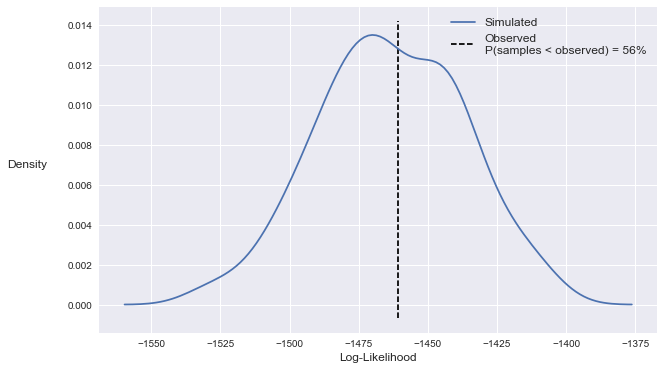

In [20]:
# Generate the simulated log-likelihoods
sim_log_likes =\
    viz.compute_prior_predictive_log_likelihoods(
        interaction_checker.sim_y,
        clean_df,
        choice_col,
        interaction_checker.model)

# Plot the simulated versus observed log-likelihood
log_like_path = None
viz.plot_predicted_log_likelihoods(sim_log_likes,
                                   interaction_checker.model.llf,
                                   output_file=log_like_path)

/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


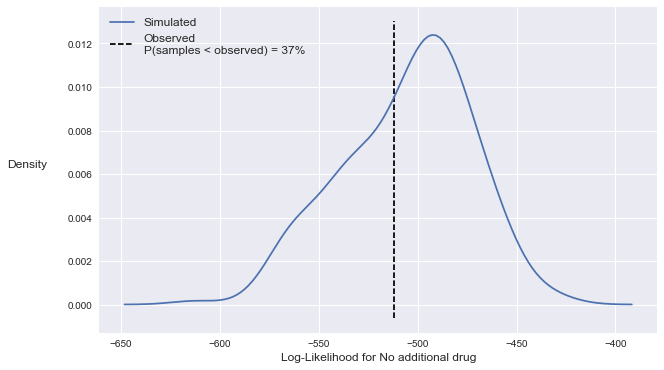

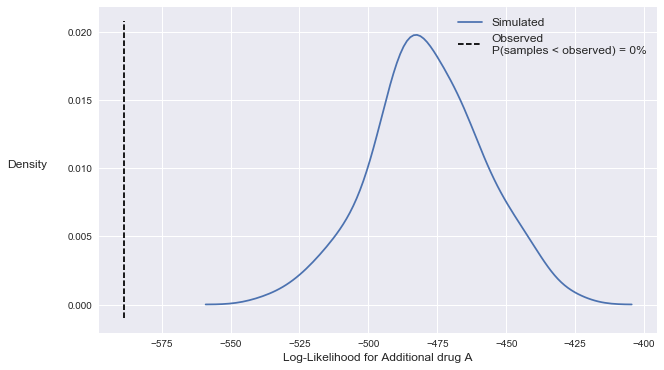

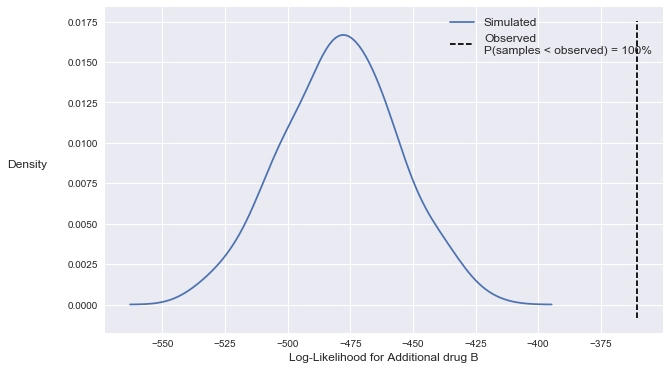

In [21]:
# Plot the simulated versus observed log-likelihood for each
# alternative
log_like_path = None
for alt_id in np.sort(clean_df[alt_id_col].unique()):
    alt_idx = clean_df[alt_id_col] == alt_id

    current_sim_y = interaction_checker.sim_y[alt_idx, :]
    current_obs_y = interaction_checker.model.choices[alt_idx]

    current_probs =\
        interaction_checker.model.long_fitted_probs[alt_idx]

    current_sim_log_likes =\
        current_sim_y.T.dot(np.log(current_probs))

    current_log_likelihood =\
        current_obs_y.dot(np.log(current_probs))

    current_alt_label = alt_id_reverse_map[alt_id]

    current_x_label =\
        'Log-Likelihood for {}'.format(current_alt_label)

    viz.plot_predicted_log_likelihoods(current_sim_log_likes,
                                       current_log_likelihood,
                                       x_label=current_x_label,
                                       output_file=log_like_path)

### 2. Outcome Boxplot

Unique x-values: 100%|██████████| 3/3 [00:00<00:00, 421.93it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/seaborn/categorical.py:454: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  box_data = remove_na(group_data)
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


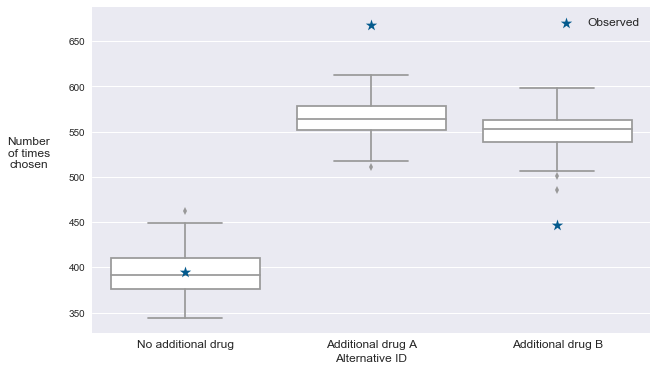

In [22]:
market_path = None
num_obs = interaction_checker.model.nobs


viz.plot_simulated_market_shares(
    clean_df[alt_id_col].values,
    interaction_checker.sim_y,
    interaction_checker.model.choices,
    x_label='Alternative ID',
    y_label='Number\nof times\nchosen',
    output_file=market_path)

### 3. Binned Reliability Plot

Plotting: 100%|██████████| 1/1 [00:00<00:00, 124.95it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
Plotting: 100%|██████████| 1/1 [00:00<00:00, 123.44it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
Plotting: 100%|██████████| 1/1 [00:00<00:00, 136.39it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


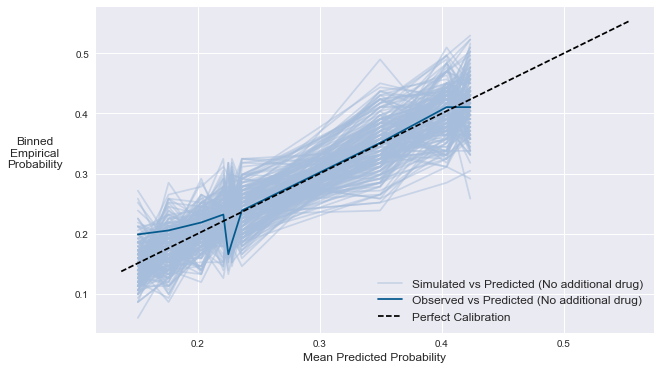

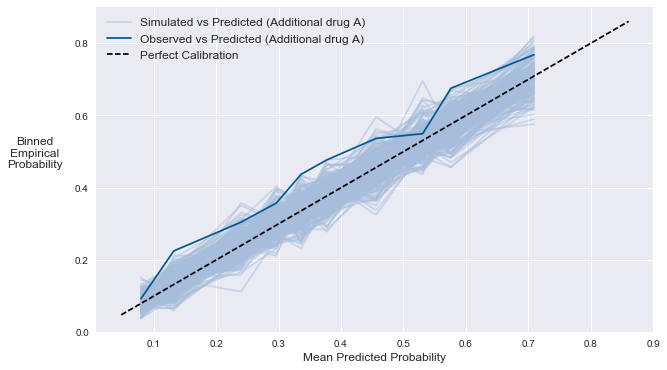

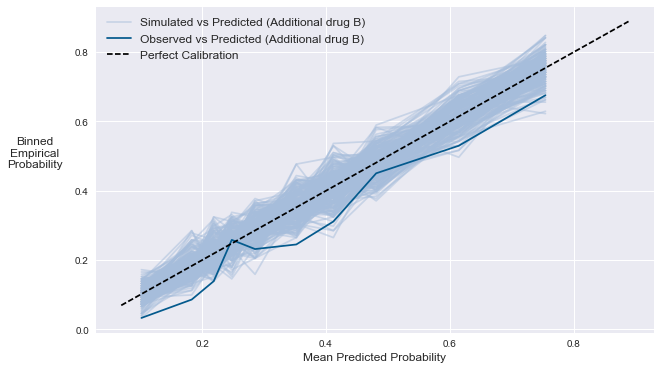

In [23]:
reload(viz)
for alt in np.sort(np.unique(interaction_checker.model.alt_IDs)):
    
    current_filter = interaction_checker.model.alt_IDs == alt
    current_probs =\
        interaction_checker.model.long_fitted_probs[current_filter]
    current_choices =\
        interaction_checker.model.choices[current_filter]
    current_sim_y = interaction_checker.sim_y[current_filter, :]
    
    current_alt = alt_id_reverse_map[alt]
    current_line_label =\
        'Observed vs Predicted ({})'.format(current_alt)
    current_sim_label =\
        'Simulated vs Predicted ({})'.format(current_alt)

    current_sim_color = '#a6bddb'
    current_obs_color = '#045a8d'

    viz.plot_binned_reliability(
        current_probs,
        current_choices,
        sim_y=current_sim_y,
        line_label=current_line_label,
        line_color=current_obs_color,
        sim_label=current_sim_label,
        sim_line_color=current_sim_color,
        figsize=(10, 6),
        ref_line=True,
        output_file=None)

### 4. 'Bagged' Reliability Plot

Plotting: 100%|██████████| 200/200 [00:31<00:00,  6.62it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
Plotting: 100%|██████████| 200/200 [00:33<00:00,  5.54it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a

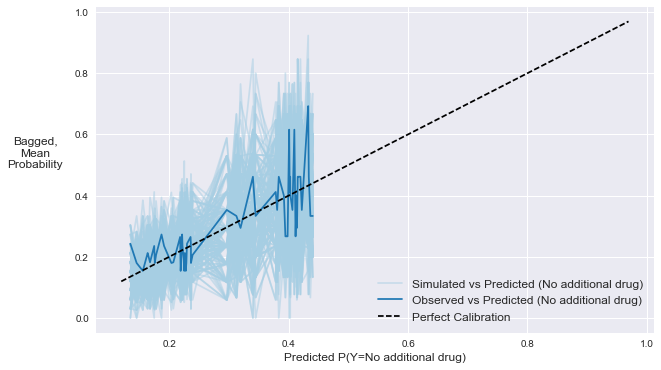

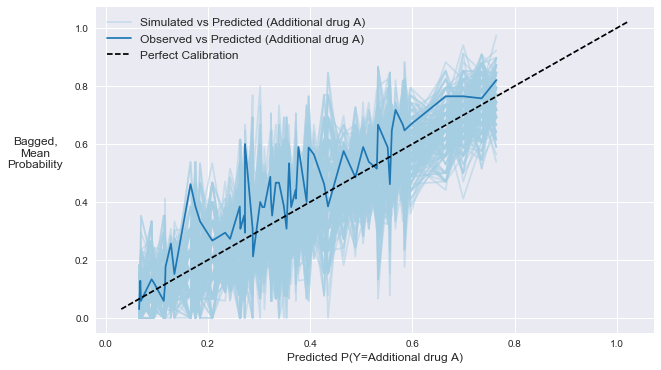

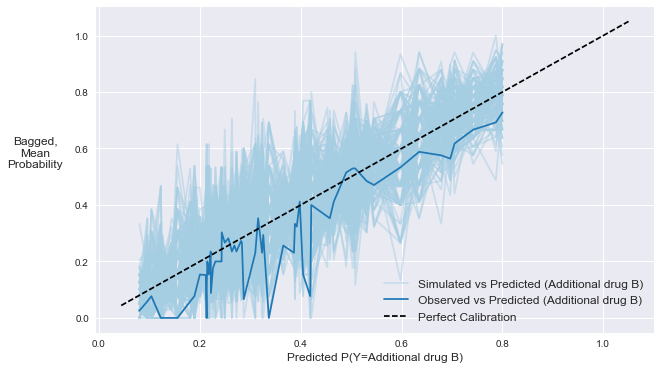

In [24]:
for alt in np.sort(np.unique(interaction_checker.model.alt_IDs)):
    current_filter = interaction_checker.model.alt_IDs == alt
    current_probs =\
        interaction_checker.model.long_fitted_probs[current_filter]
    current_choices =\
        interaction_checker.model.choices[current_filter]
    current_sim_y = interaction_checker.sim_y[current_filter, :]
    
    current_alt = alt_id_reverse_map[alt]
    current_line_label =\
        'Observed vs Predicted ({})'.format(current_alt)
    current_sim_label =\
        'Simulated vs Predicted ({})'.format(current_alt)

    filename = None

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
    fig_and_ax = [fig, ax]
    viz.make_bagged_marginal_model_plot(
        current_sim_y,
        current_choices,
        current_probs,
        y_label=current_line_label,
        prob_label=current_sim_label,
        x_label='Predicted P(Y={})'.format(current_alt),
        alpha=0.5,
        fig_and_ax=fig_and_ax,
        output_file=filename)

    # Determine the maximum value of the x-axis or y-axis
    max_ref_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
    min_ref_val = max(ax.get_xlim()[0], ax.get_ylim()[0])
    # Determine the values to use to plot the reference line
    ref_vals = np.linspace(min_ref_val, max_ref_val, num=100)
    # Plot the reference line as a black dashed line
    ax.plot(ref_vals, ref_vals, 'k--', label='Perfect Calibration')
    ax.legend(loc='best', fontsize=12)
    # Show the plot
    fig.show();

### 5. Binned marginal model plots

In [25]:
filename = None
for alt in np.sort(np.unique(interaction_checker.model.alt_IDs)):
    current_filter = interaction_checker.model.alt_IDs == alt
    current_probs =\
        interaction_checker.model.long_fitted_probs[current_filter]
    current_choices =\
        interaction_checker.model.choices[current_filter]
    current_sim_y = interaction_checker.sim_y[current_filter, :]
    
    current_alt = alt_id_reverse_map[alt]
    current_line_label =\
        'Observed P(Y={})'.format(current_alt)
    current_sim_label =\
        'Simulated P(Y={})'.format(current_alt)
    current_predicted_label =\
        'Predicted P(Y={})'.format(current_alt)
    for col in continuous_variables:
        current_x = clean_df.loc[current_filter, col].values
    
        viz.make_binned_marginal_model_plot(
            current_probs,
            current_choices,
            current_x,
            partitions=10,
            sim_y=current_sim_y,
            y_label=current_line_label,
            prob_label=current_predicted_label,
            sim_label=current_sim_label,
            x_label=col,
            alpha=0.5,
            figsize=(10, 6),
            output_file=filename)

### 6. Bagged marginal model plots

#### 6a. Check the relationships with the raw explanatory variables

In [26]:
filename = None
for alt in np.sort(np.unique(interaction_checker.model.alt_IDs)):
    current_filter = interaction_checker.model.alt_IDs == alt
    current_probs =\
        interaction_checker.model.long_fitted_probs[current_filter]
    current_choices =\
        interaction_checker.model.choices[current_filter]
    current_sim_y = interaction_checker.sim_y[current_filter, :]
    
    current_alt = alt_id_reverse_map[alt]
    current_line_label =\
        'Observed P(Y={})'.format(current_alt)
    current_sim_label =\
        'Simulated P(Y={})'.format(current_alt)
    current_predicted_label =\
        'Predicted P(Y={})'.format(current_alt)
    for col in continuous_variables:
        current_x = clean_df.loc[current_filter, col].values

        viz.make_bagged_marginal_model_plot(
            current_probs,
            current_choices,
            current_x,
            sim_y=current_sim_y,
            y_label=current_line_label,
            prob_label=current_predicted_label,
            sim_label=current_sim_label,
            x_label=col,
            alpha=0.5,
            figsize=(10, 6),
            output_file=filename)

#### 6b. Check the relationship with the estimated index, $V = X \beta$

Plotting: 100%|██████████| 200/200 [00:28<00:00,  7.23it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
Plotting: 100%|██████████| 200/200 [00:29<00:00,  6.75it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
Plotting: 100%|██████████| 200/200 [00:29<00:00,  6.30it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


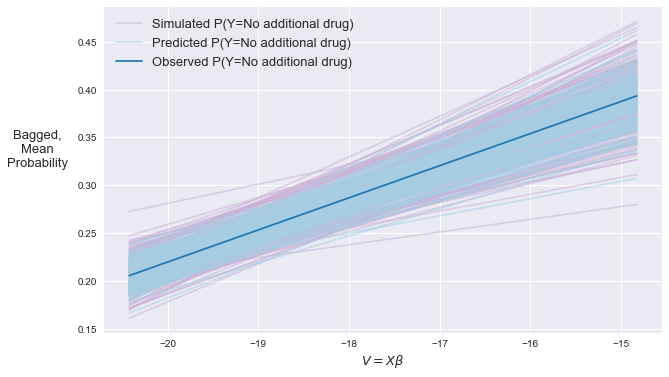

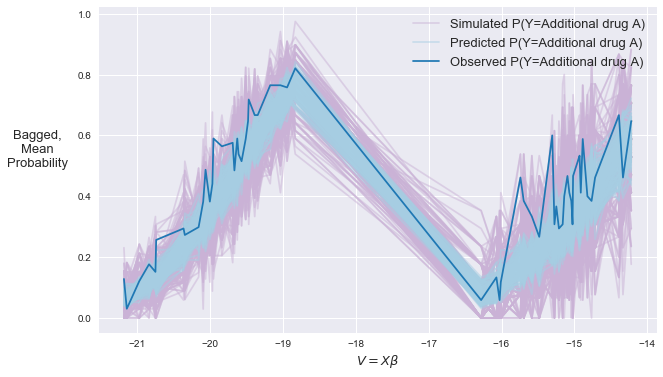

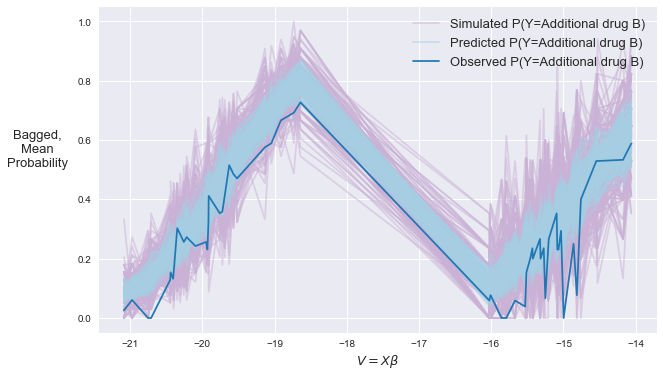

In [27]:
filename = None
for alt in np.sort(np.unique(interaction_checker.model.alt_IDs)):
    
    current_filter = interaction_checker.model.alt_IDs == alt
    current_probs =\
        interaction_checker.posterior_probs[current_filter]
    current_choices =\
        interaction_checker.model.choices[current_filter]
    current_sim_y = interaction_checker.sim_y[current_filter, :]
    
    current_alt = alt_id_reverse_map[alt]
    current_x =\
        interaction_checker.model.design.dot(
         interaction_checker.model.params)[current_filter]
        
    current_y_label = 'Observed P(Y={})'.format(current_alt)
    current_prob_label = 'Predicted P(Y={})'.format(current_alt)
    current_sim_label = 'Simulated P(Y={})'.format(current_alt)

    viz.make_bagged_marginal_model_plot(
        current_probs,
        current_choices,
        current_x,
        sim_y=current_sim_y,
        y_label=current_y_label,
        prob_label=current_prob_label,
        sim_label=current_sim_label,
        x_label=r'$V = X \beta$',
        alpha=0.5,
        figsize=(10, 6),
        fontsize=13,
        output_file=filename)

### 7. Simulated KDEs

In [28]:
filename = None
for alt in np.sort(np.unique(interaction_checker.model.alt_IDs)):
    current_filter = interaction_checker.model.alt_IDs == alt
    current_title = ''

    for col in continuous_variables:
        viz.plot_simulated_kde_traces(
            interaction_checker.sim_y,
            clean_df,
            current_filter,
            col,
            choice_col,
            label='Simulated {}'.format(col),
            title=current_title,
            figsize=(10, 6),
            output_file=filename)

### 8. Simulated CDFs

In [29]:
filename = None
for alt in np.sort(np.unique(interaction_checker.model.alt_IDs)):
    current_filter = interaction_checker.model.alt_IDs == alt
    current_title = ''

    for current_col in continuous_variables:
        viz.plot_simulated_cdf_traces(
            iteraction_checker.sim_y,
            clean_df,
            current_filter,
            current_col,
            choice_col,
            label='Simulated ({})'.format(col),
            title=current_title,
            figsize=(10, 6),
            output_file=filename)

### 9. Simulated Histograms

/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matp

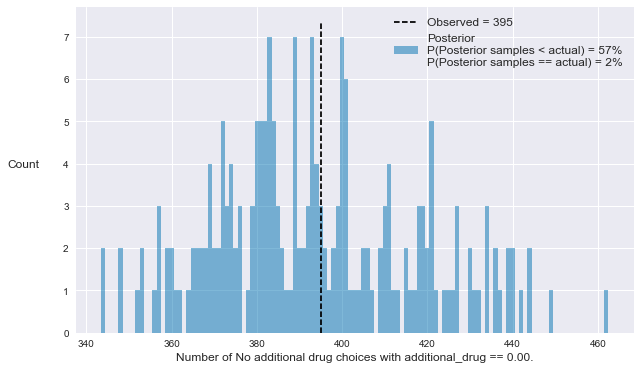

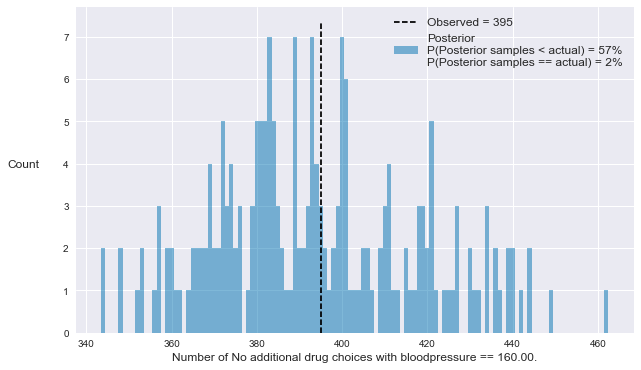

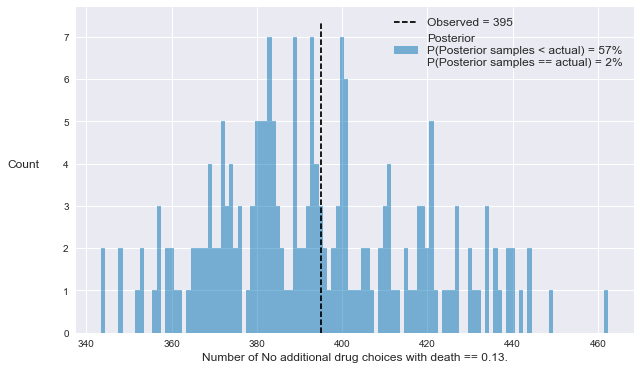

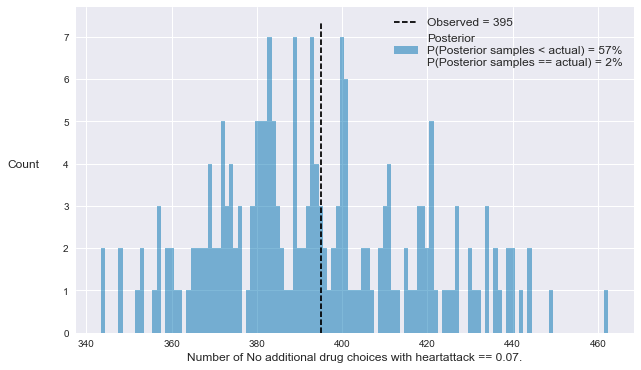

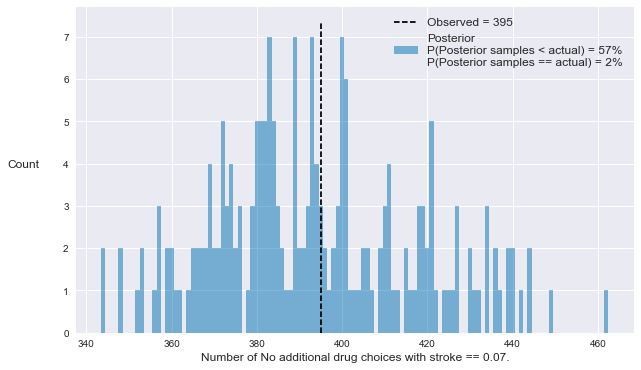

...

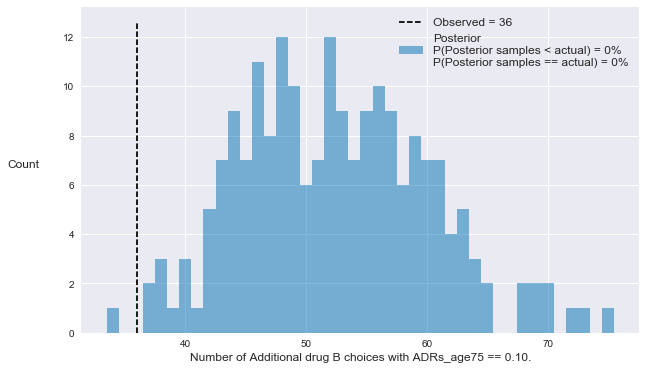

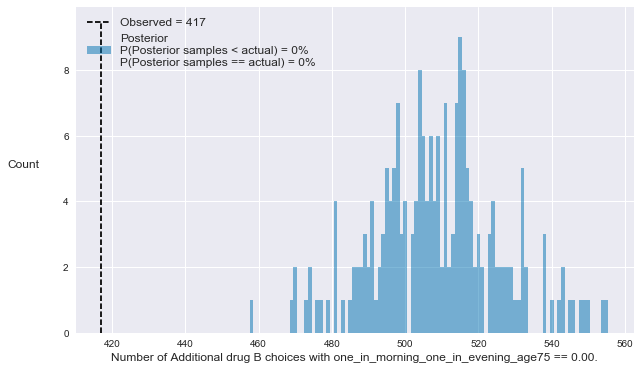

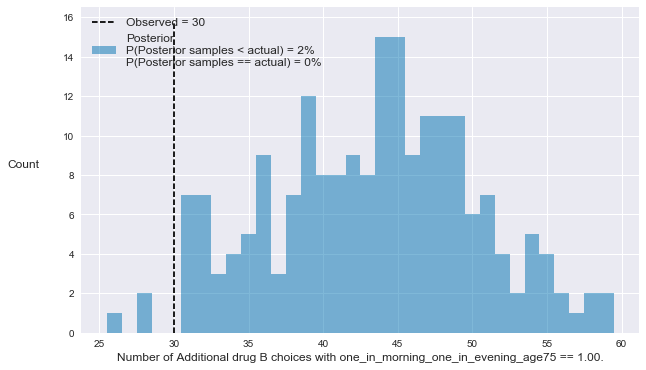

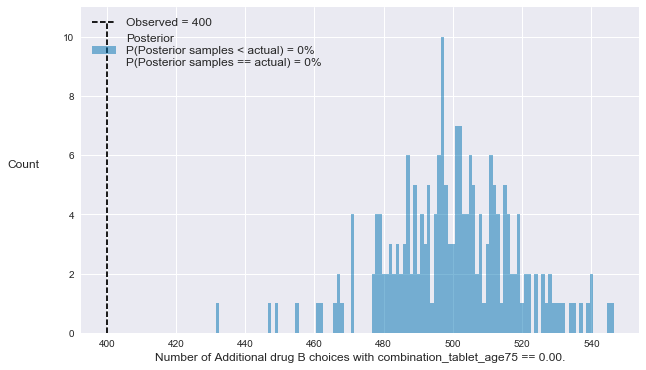

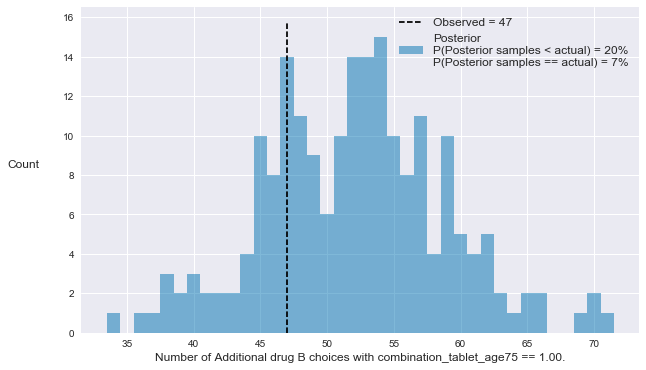

In [30]:
filename = None
for alt in np.sort(np.unique(interaction_checker.model.alt_IDs)):
    current_filter = interaction_checker.model.alt_IDs == alt
    alt_name = alt_id_reverse_map[alt]
    current_filter_name = '{} choices'.format(alt_name)
    current_title = ''

    for current_col in categorical_variables:
        viz.plot_categorical_predictive_densities(
            clean_df,
            None,
            interaction_checker.sim_y,
            current_col,
            current_filter,
            interaction_checker.model.choices.astype(int),
            title=current_title,
            filter_name=current_filter_name,
            post_color=sbn.color_palette('colorblind')[0],
            figsize=(10, 6),
            legend_loc='best',
            output_file=filename)

###  10. Simulated Lagrange Multiplier tests for mixing

### Generate artificial variables for Lagrange Multiplier Checks of the interaction model
Note that this is based on the Lagrange Multiplier tests described in McFadden, D., Train, K., 2000. Mixed MNL Models for Discrete Response. Journal of Applied Econometrics 15, 447–470.

In [31]:
# Get the rows_to_obs matrix
rows_to_obs = interaction_obj.get_mappings_for_fit()['rows_to_obs']

# Get the mean attribute values for each observation
probs_to_obs = rows_to_obs.multiply(interaction_obj.long_fitted_probs[:, None])

# Will have shape (num_obs, design[1])
x_mean_per_obs = probs_to_obs.T.dot(interaction_obj.design)

# Will have same shape as the design matrix
long_x_mean_per_obs = rows_to_obs.dot(x_mean_per_obs)

# X - X_mean_per_obs
augmented_x = interaction_obj.design - long_x_mean_per_obs

# z = 0.5 * (x - x_bar)^2
artificial_x = 0.5 * augmented_x**2

### Make the desired plots

Plotting: 100%|██████████| 200/200 [00:29<00:00,  6.63it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
Plotting: 100%|██████████| 200/200 [00:29<00:00,  6.98it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
Plotting: 100%|██████████| 200/200 [00:29<00:00,  6.44it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
Plotting: 100%|██████████| 200/200 [00:28<00:00,  7.11it/s]
/Users/timothyb0912/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:402: Us

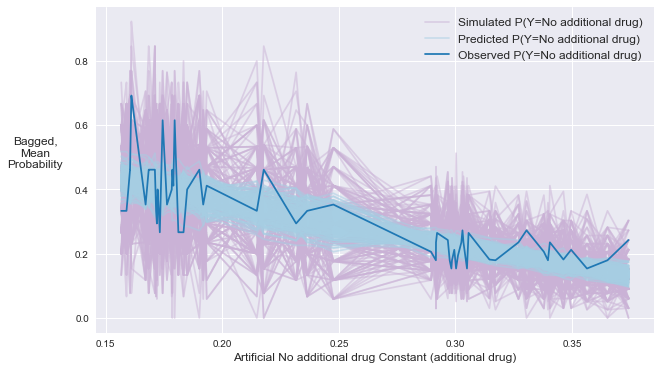

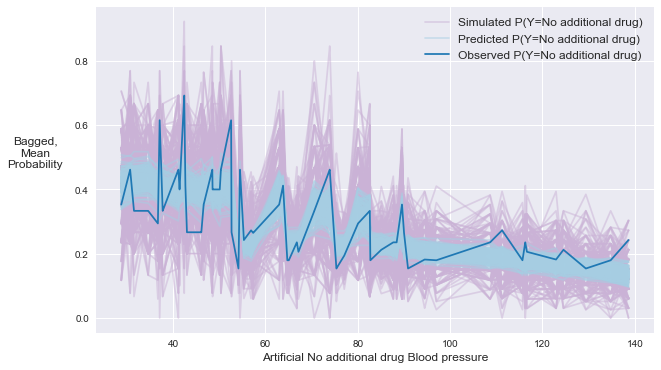

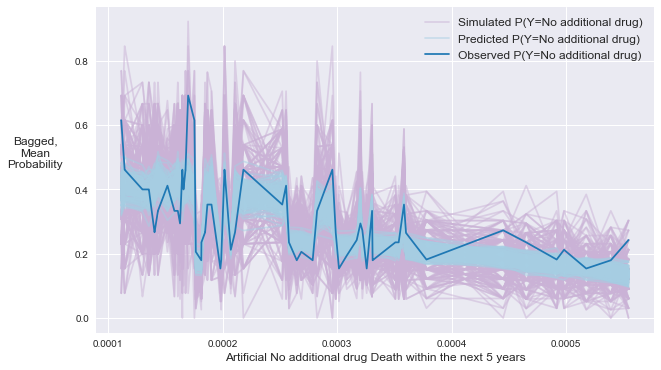

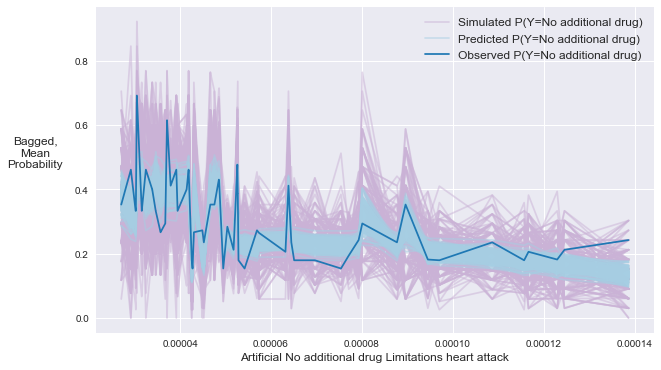

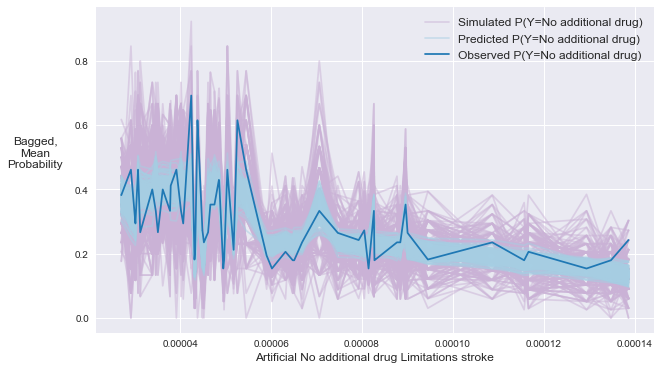

...

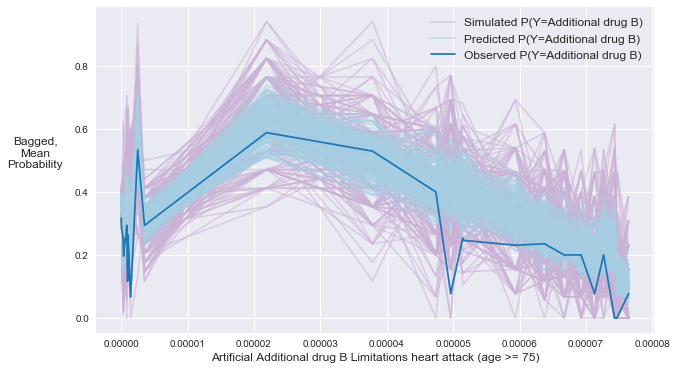

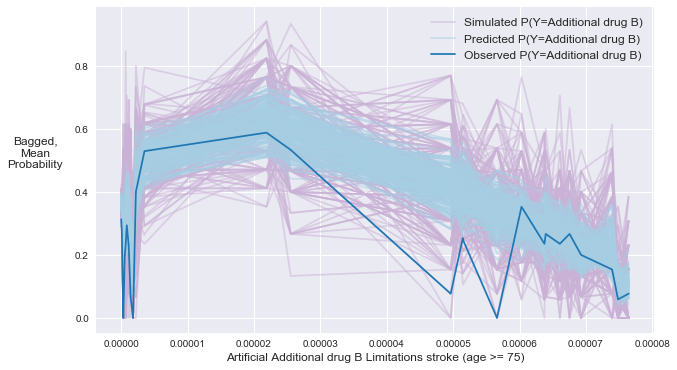

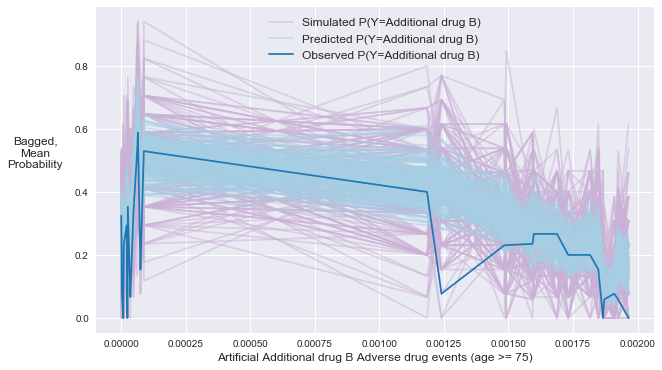

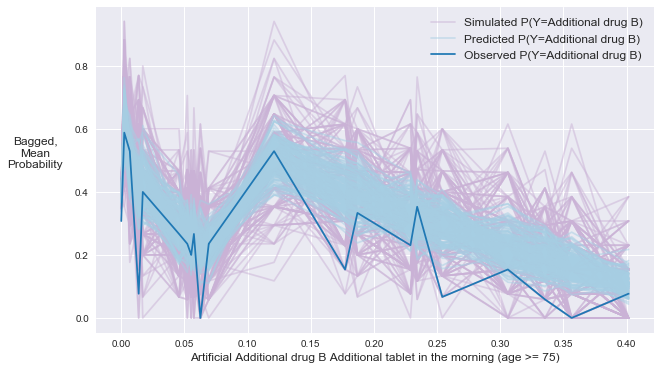

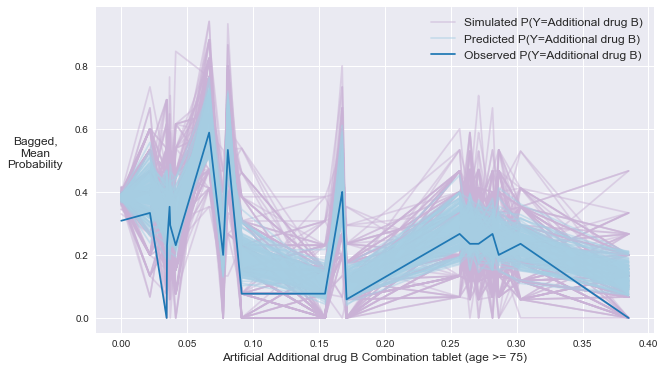

In [33]:
filename = None
for alt in np.sort(np.unique(interaction_checker.model.alt_IDs)):
    current_filter = interaction_checker.model.alt_IDs == alt
    alt_name = alt_id_reverse_map[alt]
    current_filter_name = '{} choices'.format(alt_name)
    current_title = '' 

    current_probs =\
        interaction_checker.posterior_probs[current_filter]
    current_choices =\
        interaction_checker.model.choices[current_filter]
    current_sim_y = interaction_checker.sim_y[current_filter, :]
    
    current_y_label = 'Observed P(Y={})'.format(alt_name)
    current_prob_label = 'Predicted P(Y={})'.format(alt_name)
    current_sim_label = 'Simulated P(Y={})'.format(alt_name)
    
    for col in range(interaction_checker.model.design.shape[1]):
        column_name = (interaction_checker.model
                                          .params
                                          .index
                                          .tolist()[col])
        current_x = artificial_x[current_filter, col]
        current_x_label =\
            'Artificial {} {}'.format(alt_name, column_name)


        viz.make_bagged_marginal_model_plot(
            current_probs,
            current_choices,
            current_x,
            sim_y=current_sim_y,
            y_label=current_y_label,
            prob_label=current_prob_label,
            sim_label=current_sim_label,
            x_label=current_x_label,
            alpha=0.5,
            figsize=(10, 6))

# Findings and Recommendations based on the posterior predictive checks

1. The posterior predictive checks indicate great model mis-specification for "Additional drug A" and "Additional drug B". This misfit is reiterated in the various predictive performance plots, the market share plots, the reliability plots, as well as the simulated histograms for these alternatives. Basically, "Additional drug A" is systematically over-predicted and "Additional drug B" is systematically under-predicted.
2. An alternative specific constant is likely needed for "Additional drug A" and for "Additional drug B".
3. Based on the Lagrange Multiplier checks, a mixed logit specification may perhaps be necessary for some variables in the utility specifications for "Additional drug A" and "Additional drug B" alternatives. However, I think this is just an artifact of having all the predicted probabilities for those two alternatives be systematically over/under-estimated.